Library Import

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math
%matplotlib inline
# from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
import numpy as np


# Data cleaning
### Inspecting structure

In [3]:
file_path="weatherAUS.csv"
data = pd.read_csv( file_path, parse_dates=['Date'])
data.set_index('Date', inplace=True)
data.shape

(145460, 22)

In [4]:
for columns in data.columns:
    print(f"The number of null elements in {columns} column is: {data[columns].isnull().sum()}")


The number of null elements in Location column is: 0
The number of null elements in MinTemp column is: 1485
The number of null elements in MaxTemp column is: 1261
The number of null elements in Rainfall column is: 3261
The number of null elements in Evaporation column is: 62790
The number of null elements in Sunshine column is: 69835
The number of null elements in WindGustDir column is: 10326
The number of null elements in WindGustSpeed column is: 10263
The number of null elements in WindDir9am column is: 10566
The number of null elements in WindDir3pm column is: 4228
The number of null elements in WindSpeed9am column is: 1767
The number of null elements in WindSpeed3pm column is: 3062
The number of null elements in Humidity9am column is: 2654
The number of null elements in Humidity3pm column is: 4507
The number of null elements in Pressure9am column is: 15065
The number of null elements in Pressure3pm column is: 15028
The number of null elements in Cloud9am column is: 55888
The number

In [5]:
data.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 145460 entries, 01-12-2008 to 25-06-2017
Data columns (total 22 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Location       145460 non-null  object 
 1   MinTemp        143975 non-null  float64
 2   MaxTemp        144199 non-null  float64
 3   Rainfall       142199 non-null  float64
 4   Evaporation    82670 non-null   float64
 5   Sunshine       75625 non-null   float64
 6   WindGustDir    135134 non-null  object 
 7   WindGustSpeed  135197 non-null  float64
 8   WindDir9am     134894 non-null  object 
 9   WindDir3pm     141232 non-null  object 
 10  WindSpeed9am   143693 non-null  float64
 11  WindSpeed3pm   142398 non-null  float64
 12  Humidity9am    142806 non-null  float64
 13  Humidity3pm    140953 non-null  float64
 14  Pressure9am    130395 non-null  float64
 15  Pressure3pm    130432 non-null  float64
 16  Cloud9am       89572 non-null   float64
 17  Cloud3pm       86102 

In [7]:
print("Number of unique elements in each columns is:")
data.nunique()

Number of unique elements in each columns is:


Location          49
MinTemp          389
MaxTemp          505
Rainfall         681
Evaporation      358
Sunshine         145
WindGustDir       16
WindGustSpeed     67
WindDir9am        16
WindDir3pm        16
WindSpeed9am      43
WindSpeed3pm      44
Humidity9am      101
Humidity3pm      101
Pressure9am      546
Pressure3pm      549
Cloud9am          10
Cloud3pm          10
Temp9am          441
Temp3pm          502
RainToday          2
RainTomorrow       2
dtype: int64

### Imputation and removal of data

In [8]:
data[['MinTemp','MaxTemp']]=data[['MinTemp','MaxTemp']].interpolate(method='linear')
# data['MaxTemp'].interpolate(method='linear', inplace=True)
#as data of temperature varies linearly with time, therefore interpolationw ill work fine

##### To check if the operation of interpolation worked successfully or not.

In [9]:
print(data['MaxTemp'].isna().sum())
print(data['MinTemp'].isna().sum())

0
0


In [10]:
data[['Temp9am', 'Temp3pm']] = data[['Temp9am', 'Temp3pm']].interpolate(method='linear')

In [11]:
print(data['Temp9am'].isna().sum())
print(data['Temp3pm'].isna().sum())

0
0


##### Humidity , Pressure and Rainfall

In [12]:
data['Humidity9am']=data['Humidity9am'].interpolate(method='linear')
data['Humidity3pm']=data['Humidity3pm'].interpolate(method='linear')

In [13]:
data['Pressure9am']=data['Pressure9am'].interpolate(method='linear')
data['Pressure3pm']=data['Pressure3pm'].interpolate(method='linear')

In [14]:
print(data['RainToday'].value_counts())
for columns in data.columns:
    print(f"The number of null elements in {columns} column is: {data[columns].isnull().sum()}")


RainToday
No     110319
Yes     31880
Name: count, dtype: int64
The number of null elements in Location column is: 0
The number of null elements in MinTemp column is: 0
The number of null elements in MaxTemp column is: 0
The number of null elements in Rainfall column is: 3261
The number of null elements in Evaporation column is: 62790
The number of null elements in Sunshine column is: 69835
The number of null elements in WindGustDir column is: 10326
The number of null elements in WindGustSpeed column is: 10263
The number of null elements in WindDir9am column is: 10566
The number of null elements in WindDir3pm column is: 4228
The number of null elements in WindSpeed9am column is: 1767
The number of null elements in WindSpeed3pm column is: 3062
The number of null elements in Humidity9am column is: 0
The number of null elements in Humidity3pm column is: 0
The number of null elements in Pressure9am column is: 0
The number of null elements in Pressure3pm column is: 0
The number of null elem

In [15]:
Rain_today = {'No': 0, 'Yes': 1}
data['RainToday'] = data['RainToday'].map(Rain_today).astype(float)
data['RainTomorrow'] = data['RainTomorrow'].map(Rain_today).astype(float)

In [16]:
print(data[data['RainToday'].isnull()]['Rainfall'].isnull().sum())
print(data[data['RainToday'].isnull()]['RainTomorrow'].isnull().sum())

3261
1855


In [17]:
data['RainTomorrow'].isnull().sum()

np.int64(3267)

##### As number of empty portions in Raintoday and Raintomorrow is very less therefore we drop those rows

In [18]:
data = data.dropna(subset=['RainToday','RainTomorrow'])

##### Wind

In [19]:
data['WindSpeed9am']=data['WindSpeed9am'].interpolate(method='linear')
data['WindSpeed3pm']=data['WindSpeed3pm'].interpolate(method='linear')

In [20]:
data['WindGustSpeed']= data['WindGustSpeed'].interpolate(method='linear')

In [21]:
directions_code = {
    'N': (math.cos(math.radians(0)), math.sin(math.radians(0))),
    'NNE': (math.cos(math.radians(22.5)), math.sin(math.radians(22.5))),
    'NE': (math.cos(math.radians(45)), math.sin(math.radians(45))),
    'ENE': (math.cos(math.radians(67.5)), math.sin(math.radians(67.5))),
    'E': (math.cos(math.radians(90)), math.sin(math.radians(90))),
    'ESE': (math.cos(math.radians(112.5)), math.sin(math.radians(112.5))),
    'SE': (math.cos(math.radians(135)), math.sin(math.radians(135))),
    'SSE': (math.cos(math.radians(157.5)), math.sin(math.radians(157.5))),
    'S': (math.cos(math.radians(180)), math.sin(math.radians(180))),
    'SSW': (math.cos(math.radians(202.5)), math.sin(math.radians(202.5))),
    'SW': (math.cos(math.radians(225)), math.sin(math.radians(225))),
    'WSW': (math.cos(math.radians(247.5)), math.sin(math.radians(247.5))),
    'W': (math.cos(math.radians(270)), math.sin(math.radians(270))),
    'WNW': (math.cos(math.radians(292.5)), math.sin(math.radians(292.5))),
    'NW': (math.cos(math.radians(315)), math.sin(math.radians(315))),
    'NNW': (math.cos(math.radians(337.5)), math.sin(math.radians(337.5))),
}
# data.dropna(subset=['WindGustDir','WindDir3pm','WindDir9am'])

data['WindGustDirCos'] = data['WindGustDir'].map(lambda dir: directions_code.get(dir, (None, None))[0])
data['WindGustDirSin'] = data['WindGustDir'].map(lambda dir: directions_code.get(dir, (None, None))[1])

data['WindDir9amCos'] = data['WindDir9am'].map(lambda dir: directions_code.get(dir, (None, None))[0])

data['WindDir9amSin'] = data['WindDir9am'].map(lambda dir: directions_code.get(dir, (None, None))[1])

data['WindDir3pmCos'] = data['WindDir3pm'].map(lambda dir: directions_code.get(dir, (None, None))[0])

data['WindDir3pmSin'] = data['WindDir3pm'].map(lambda dir: directions_code.get(dir, (None, None))[1])


In [22]:
data['WindGustDirCos']=data['WindGustDirCos'].interpolate(method='linear')
data['WindGustDirSin']=data['WindGustDirSin'].interpolate(method='linear')
data['WindDir9amCos']=data['WindDir9amCos'] .interpolate(method='linear')
data['WindDir9amSin']=data['WindDir9amSin'].interpolate(method='linear')
data['WindDir3pmCos']=data['WindDir3pmCos'].interpolate(method='linear')
data['WindDir3pmSin']=data['WindDir3pmSin'].interpolate(method='linear')
data.describe()


,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Temp9am,Temp3pm,RainToday,RainTomorrow,WindGustDirCos,WindGustDirSin,WindDir9amCos,WindDir9amSin,WindDir3pmCos,WindDir3pmSin
count,140787.000000,140787.000000,140787.000000,81093.000000,73982.000000,140787.00000,140787.000000,140787.000000,140787.000000,140787.000000,...,140787.000000,140787.000000,140787.000000,140787.000000,1.407870e+05,140787.000000,1.407870e+05,1.407870e+05,1.407870e+05,140787.000000
mean,12.187846,23.236565,2.349974,5.472516,7.630540,39.95886,13.994847,18.759371,68.855251,51.426339,...,16.966687,21.731573,0.223423,0.221618,-6.778706e-02,-0.041928,1.512876e-02,1.682152e-02,-4.977538e-02,-0.015648
std,6.401187,7.114014,8.465173,4.189132,3.781729,13.34605,8.873447,8.866090,19.133503,20.722229,...,6.509298,6.935293,0.416541,0.415337,6.882995e-01,0.704626,7.087887e-01,6.845565e-01,6.972007e-01,0.707707
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.00000,0.000000,0.000000,0.000000,0.000000,...,-7.200000,-5.400000,0.000000,0.000000,-1.000000e+00,-1.000000,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000
25%,7.600000,17.900000,0.000000,2.600000,4.900000,31.00000,7.000000,13.000000,57.000000,37.000000,...,12.200000,16.650092,0.000000,0.000000,-7.071068e-01,-0.707107,-7.071068e-01,-7.071068e-01,-7.071068e-01,-0.707107
50%,12.000000,22.600000,0.000000,4.800000,8.500000,39.00000,13.000000,19.000000,70.000000,52.000000,...,16.700000,21.200000,0.000000,0.000000,-1.836970e-16,0.000000,6.123234e-17,1.110223e-16,-1.836970e-16,0.000000
75%,16.800000,28.300000,0.800000,7.400000,10.700000,48.00000,19.000000,24.000000,83.000000,65.000000,...,21.600000,26.500000,0.000000,0.000000,7.071068e-01,0.707107,7.071068e-01,7.071068e-01,7.071068e-01,0.707107
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.00000,130.000000,87.000000,100.000000,100.000000,...,40.200000,46.700000,1.000000,1.000000,1.000000e+00,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000


### For sunshine, evaporation and rainfall, we can replace those columns with the median values

In [23]:


impute_col = ['Sunshine','Evaporation','Cloud9am','Cloud3pm']
print(impute_col)

# Apply median imputation for numerical columns
num_imputer = SimpleImputer(strategy="median")
data[impute_col] = num_imputer.fit_transform(data[impute_col])
for columns in data.columns:
    print(f"The number of null elements in {columns} column is: {data[columns].isnull().sum()}")
# Verify if missing values are handled

['Sunshine', 'Evaporation', 'Cloud9am', 'Cloud3pm']
The number of null elements in Location column is: 0
The number of null elements in MinTemp column is: 0
The number of null elements in MaxTemp column is: 0
The number of null elements in Rainfall column is: 0
The number of null elements in Evaporation column is: 0
The number of null elements in Sunshine column is: 0
The number of null elements in WindGustDir column is: 9163
The number of null elements in WindGustSpeed column is: 0
The number of null elements in WindDir9am column is: 9660
The number of null elements in WindDir3pm column is: 3670
The number of null elements in WindSpeed9am column is: 0
The number of null elements in WindSpeed3pm column is: 0
The number of null elements in Humidity9am column is: 0
The number of null elements in Humidity3pm column is: 0
The number of null elements in Pressure9am column is: 0
The number of null elements in Pressure3pm column is: 0
The number of null elements in Cloud9am column is: 0
The n

In [24]:
refined_data = data.drop(['WindGustDir','WindDir3pm','WindDir9am'], axis=1)  
# Dropping columns as wahtever they contained is now represented in other columns(sin and cos of dir)

print(refined_data['RainToday'].value_counts())

RainToday
0.0    109332
1.0     31455
Name: count, dtype: int64


Redundant data

In [25]:
refined_data.isnull().sum()

Location          0
MinTemp           0
MaxTemp           0
Rainfall          0
Evaporation       0
Sunshine          0
WindGustSpeed     0
WindSpeed9am      0
WindSpeed3pm      0
Humidity9am       0
Humidity3pm       0
Pressure9am       0
Pressure3pm       0
Cloud9am          0
Cloud3pm          0
Temp9am           0
Temp3pm           0
RainToday         0
RainTomorrow      0
WindGustDirCos    0
WindGustDirSin    0
WindDir9amCos     0
WindDir9amSin     0
WindDir3pmCos     0
WindDir3pmSin     0
dtype: int64

### For duplicate data

In [26]:
# Check for duplicate rows
duplicate_count = refined_data.duplicated().sum()
duplicate_count
#no duplicate rows present

np.int64(0)

In [27]:

# unique_locations = data['Location'].unique()
# location_dict = {location: idx + 1 for idx, location in enumerate(unique_locations)}

# refined_data['Location'] = refined_data['Location'].map(location_dict).astype('float64')


### Detecting and treating outliers

In [28]:
columns=['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm','Temp9am', 'Temp3pm']

def outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return len(outliers), lower_bound, upper_bound

# Check for outliers in numerical columns
# print(refined_data.columns)
outlier_counts = {col: outliers_iqr(refined_data, col)[0] for col in columns}
# Sort and display columns with highest outliers
sorted_outliers = sorted(outlier_counts.items(), key=lambda x: x[1], reverse=True)
sorted_outliers 
# print(columns)


[('Sunshine', 60508),
 ('Evaporation', 32216),
 ('Rainfall', 25228),
 ('WindGustSpeed', 2975),
 ('WindSpeed3pm', 2586),
 ('WindSpeed9am', 1715),
 ('Humidity9am', 1479),
 ('Pressure9am', 1120),
 ('Pressure3pm', 998),
 ('Temp3pm', 686),
 ('MaxTemp', 387),
 ('Temp9am', 226),
 ('MinTemp', 61),
 ('Humidity3pm', 0)]

### For Rainfall and Evaporation, extreme values may indicate unusual weather conditions rather than actual errors, so instead of removing them, capping at the upper/lower bounds may be more appropriate.
### For variables like WindGustSpeed, Pressure9am, and Pressure3pm, values outside a reasonable range can also be replaced with upper/lower bounds.

In [29]:
refined_data_without_outliers=refined_data
# print(col)
# print(columns)
def replace_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # Replace values below lower bound with lower bound, and above upper bound with upper bound
    data[column] = data[column].clip(lower=lower_bound, upper=upper_bound)
    return data

# Apply outlier removal for each column
refined_data_without_outliers = refined_data.copy()
for col in columns:
    refined_data_without_outliers = replace_outliers_iqr(refined_data, col)
# Verify outliers after treatment
outlier_counts_after = {col: outliers_iqr(refined_data_without_outliers, col)[0] for col in columns}
# print(outlier_counts_after)
sum(outlier_counts_after.values()) 
# Total remaining outliers should become 0

0

#  2. Exploratory Data Analysis (EDA)
###  Univariate Analysis (Single-Variable Exploration)
##### Summary Statistics

In [30]:
# print(refined_data_without_outliers.columns)
numericalcols=['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'WindGustDirCos',
       'WindGustDirSin', 'WindDir9amCos', 'WindDir9amSin', 'WindDir3pmCos',
       'WindDir3pmSin']
stats = refined_data_without_outliers[numericalcols].describe().T
stats["mode"] = refined_data_without_outliers[numericalcols].mode().T[0]
stats["skew"] = refined_data_without_outliers[numericalcols].skew()
stats["variance"] = refined_data_without_outliers[numericalcols].var()
stats.T

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,Cloud9am,Cloud3pm,Temp9am,Temp3pm,WindGustDirCos,WindGustDirSin,WindDir9amCos,WindDir9amSin,WindDir3pmCos,WindDir3pmSin
count,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,140787.000000,...,140787.000000,140787.000000,140787.000000,140787.000000,1.407870e+05,140787.000000,1.407870e+05,1.407870e+05,1.407870e+05,140787.000000
mean,12.188021,23.239410,0.485723,4.796336,8.473191,39.777203,13.906188,18.669811,68.912837,51.426339,...,4.643788,4.698765,16.967565,21.734545,-6.778706e-02,-0.041928,1.512876e-02,1.682152e-02,-4.977538e-02,-0.015648
std,6.400271,7.098931,0.791851,1.635353,0.680304,12.760362,8.575610,8.589082,18.967297,20.722229,...,2.300772,2.123656,6.503025,6.909960,6.882995e-01,0.704626,7.087887e-01,6.845565e-01,6.972007e-01,0.707707
min,-6.200000,2.300000,0.000000,1.900000,7.450000,6.000000,0.000000,0.000000,18.000000,0.000000,...,0.000000,0.000000,-1.900000,1.875231,-1.000000e+00,-1.000000,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000
25%,7.600000,17.900000,0.000000,4.000000,8.200000,31.000000,7.000000,13.000000,57.000000,37.000000,...,3.000000,4.000000,12.200000,16.650092,-7.071068e-01,-0.707107,-7.071068e-01,-7.071068e-01,-7.071068e-01,-0.707107
50%,12.000000,22.600000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,...,5.000000,5.000000,16.700000,21.200000,-1.836970e-16,0.000000,6.123234e-17,1.110223e-16,-1.836970e-16,0.000000
75%,16.800000,28.300000,0.800000,5.400000,8.700000,48.000000,19.000000,24.000000,83.000000,65.000000,...,6.000000,6.000000,21.600000,26.500000,7.071068e-01,0.707107,7.071068e-01,7.071068e-01,7.071068e-01,0.707107
max,30.600000,43.900000,2.000000,7.500000,9.450000,73.500000,37.000000,40.500000,100.000000,100.000000,...,9.000000,9.000000,35.700000,41.274861,1.000000e+00,1.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000
mode,9.600000,20.000000,0.000000,4.800000,8.500000,35.000000,9.000000,13.000000,99.000000,52.000000,...,5.000000,5.000000,17.000000,20.000000,-1.836970e-16,0.707107,1.000000e+00,7.071068e-01,-7.071068e-01,0.707107
skew,0.026090,0.242338,1.239904,-0.021611,-0.112970,0.561976,0.501244,0.388805,-0.435011,0.035556,...,-0.546757,-0.559368,0.089364,0.231350,1.665396e-01,0.095645,-1.930767e-02,-3.409425e-02,1.133043e-01,0.016287


Frequency distribution for Cloud9am:



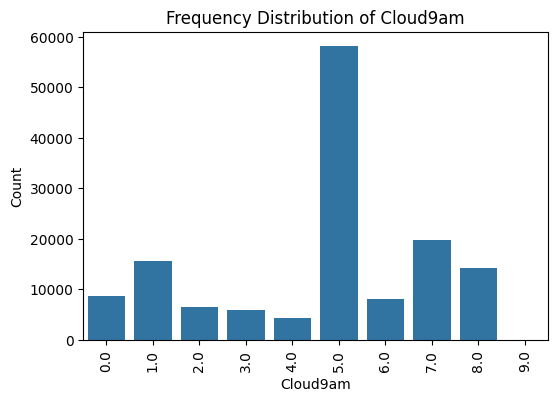

Frequency distribution for Cloud3pm:



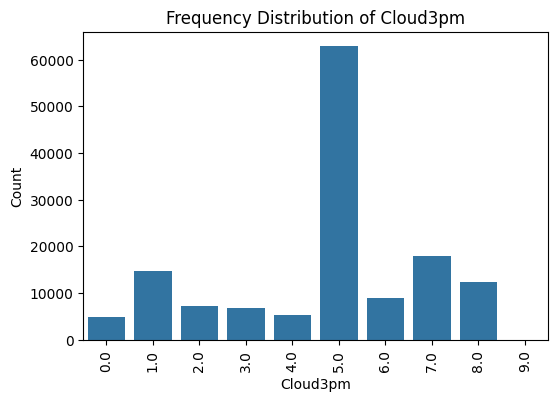

Frequency distribution for Location:



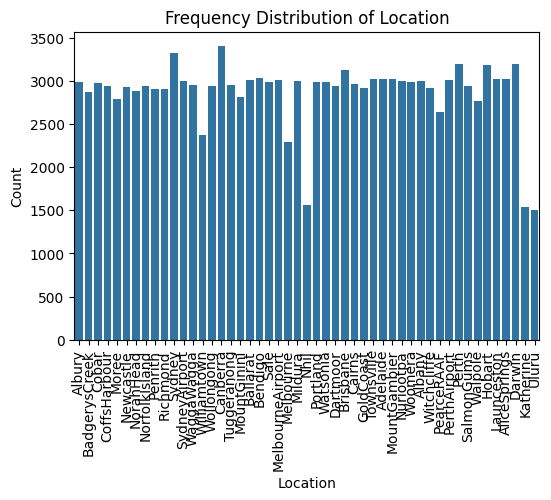

Frequency distribution for RainToday:



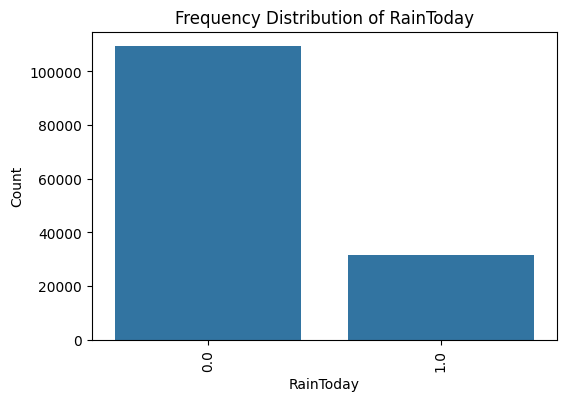

Frequency distribution for RainTomorrow:



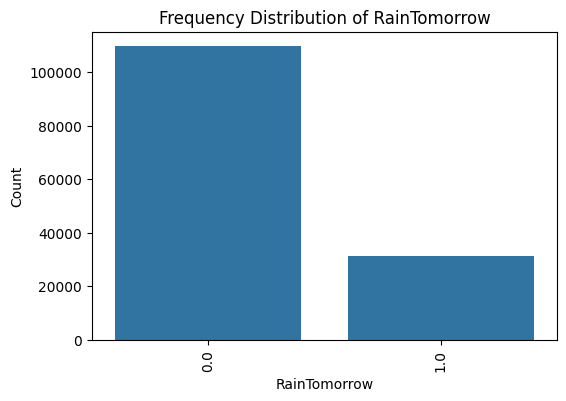

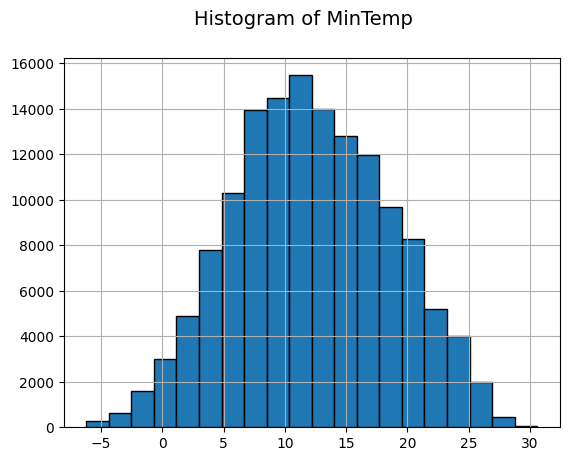

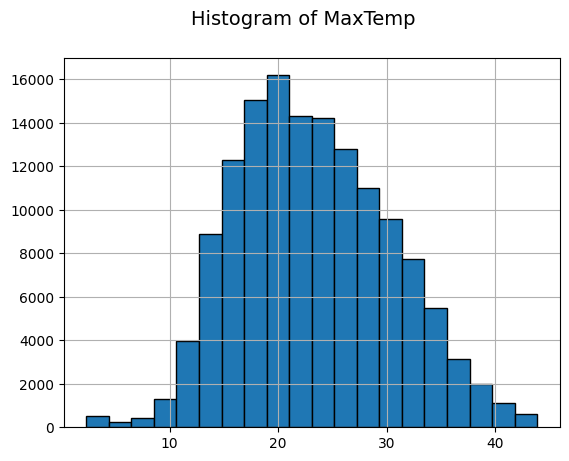

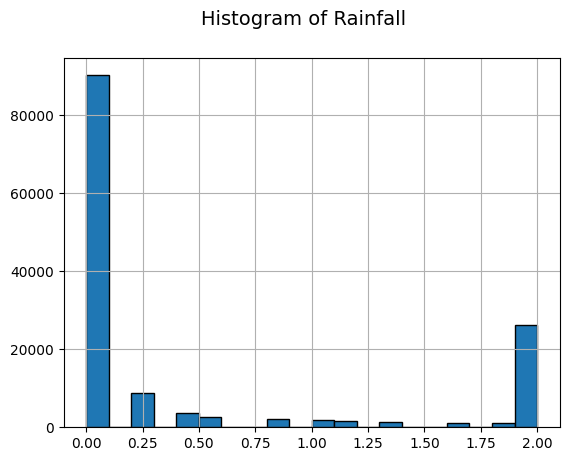

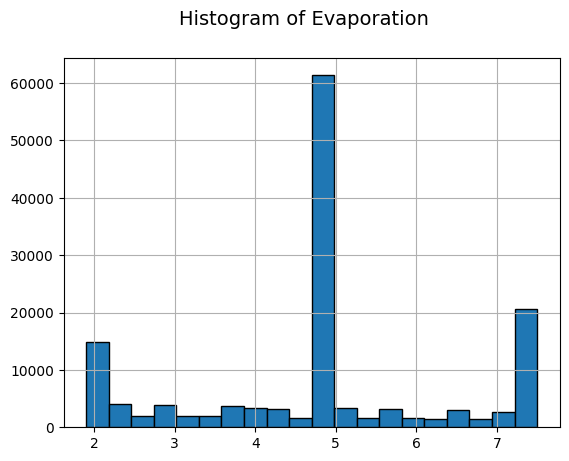

...

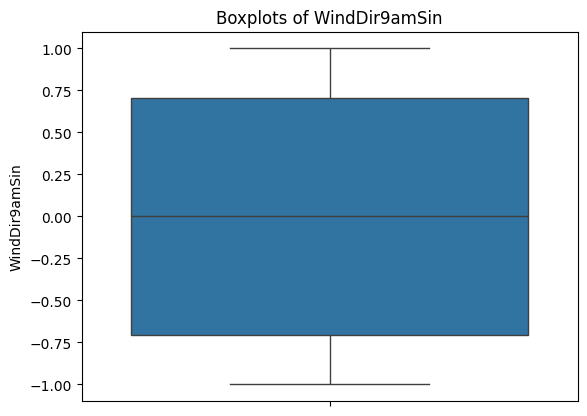

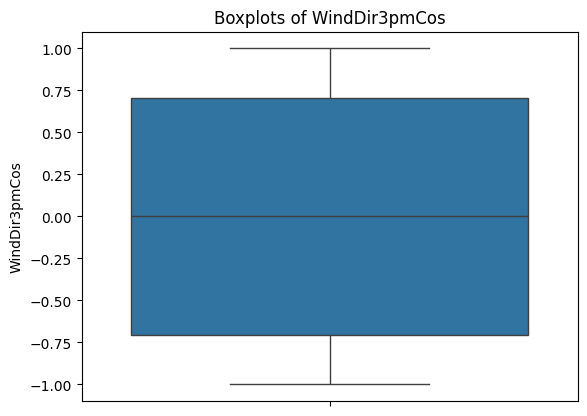

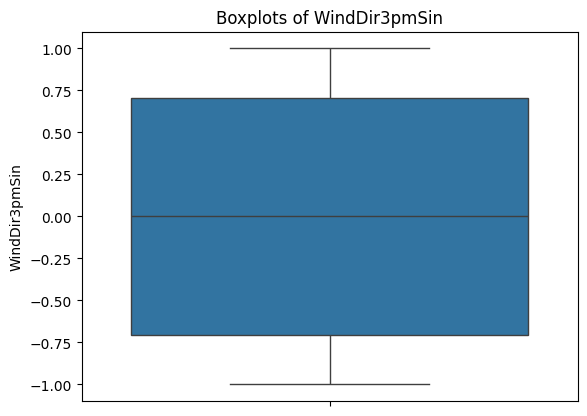

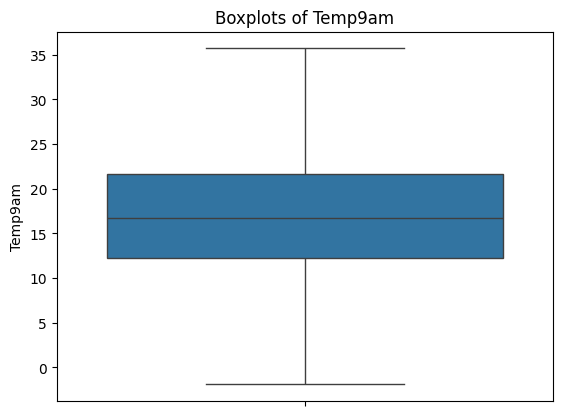

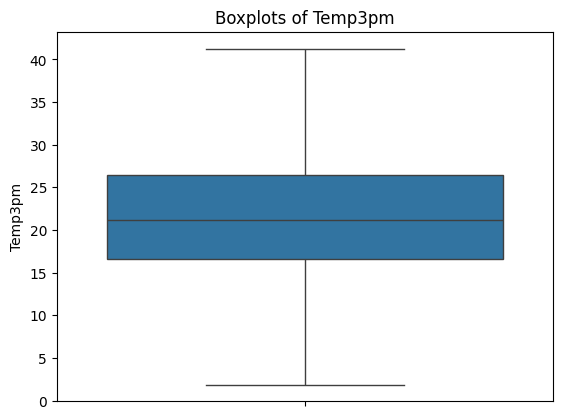

In [31]:
numericalcols =['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'WindGustDirCos', 'WindGustDirSin','WindDir9amCos', 'WindDir9amSin','WindDir3pmCos', 'WindDir3pmSin',
       'Temp9am', 'Temp3pm']
categorical_cols=['Cloud9am', 'Cloud3pm','Location','RainToday','RainTomorrow']

# Summary statistics for numerical columns
# print(refined_data['Location'])
# Histograms for numerical variables
for col in categorical_cols:
    print(f"Frequency distribution for {col}:\n")
    # print(refined_data_without_outliers[col].value_counts())
    
    # Count Plot (Bar Chart)
    plt.figure(figsize=(6, 4))
    sns.countplot(x=refined_data_without_outliers[col])
    plt.title(f"Frequency Distribution of {col}")
    plt.xlabel(col)
    plt.xticks(rotation=90)
    plt.ylabel("Count")
    plt.show()
    
# for coll in categorical_cols:
# # Bar Plot for better visualization

#     freq_location = refined_data_without_outliers[coll].value_counts()
#     freq_location.plot(kind='bar',  edgecolor='black')
#     plt.suptitle(f"Frequency distributions for {coll}", fontsize=14)
#     plt.xticks(rotation=90)  # Rotate labels for readability
#     plt.show()
for coll in numericalcols:
    refined_data_without_outliers[coll].hist( bins=20, edgecolor='black')
    plt.suptitle(f"Histogram of {coll}", fontsize=14)
    plt.show()


# Boxplots to visualize distributions and remaining anomalies
# plt.figure(figsize=(15, 10))
for ccc in numericalcols:
    sns.boxplot(data=refined_data_without_outliers[ccc])
    plt.xticks(rotation=90)
    plt.title(f"Boxplots of {ccc}")
    plt.show()


### Scatter and bar plots

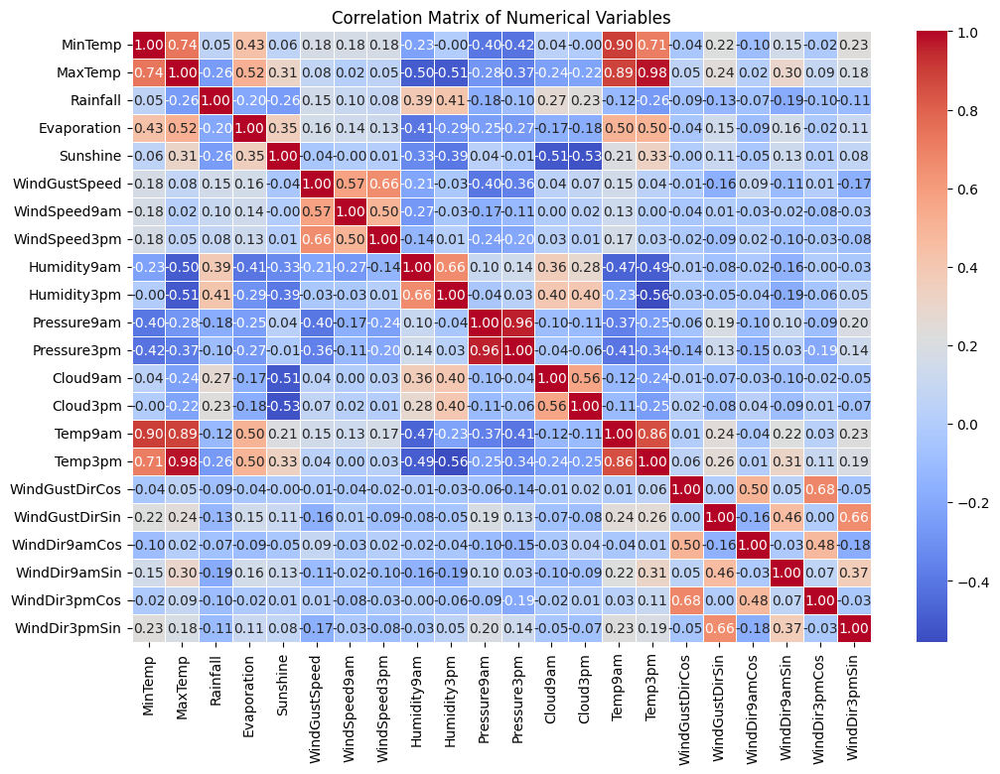

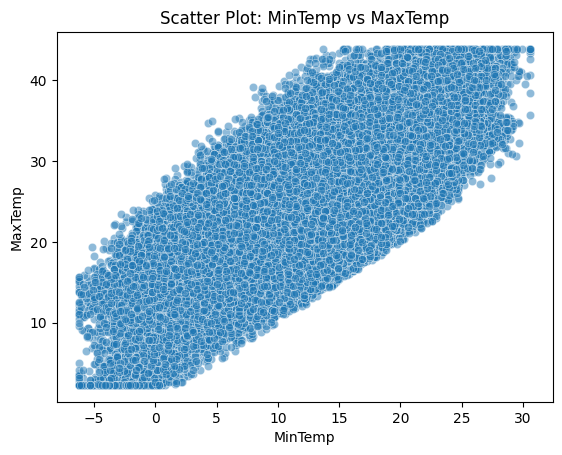

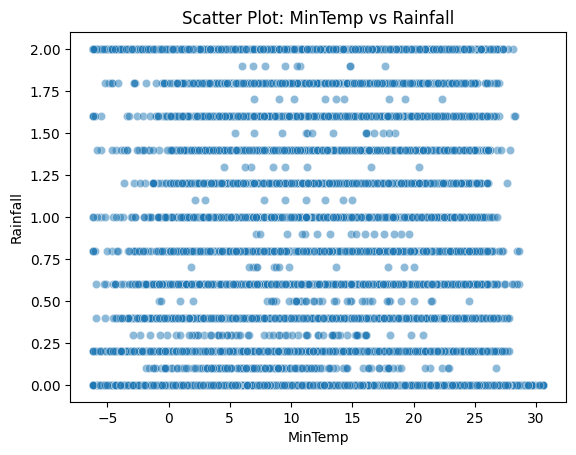

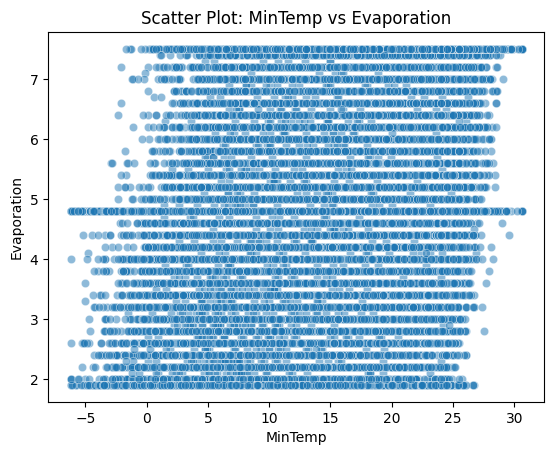

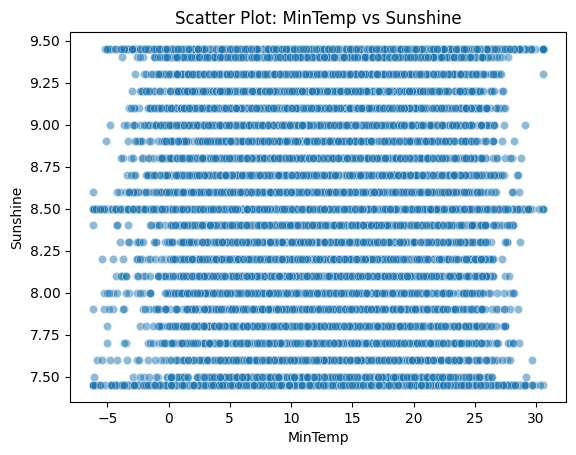

...

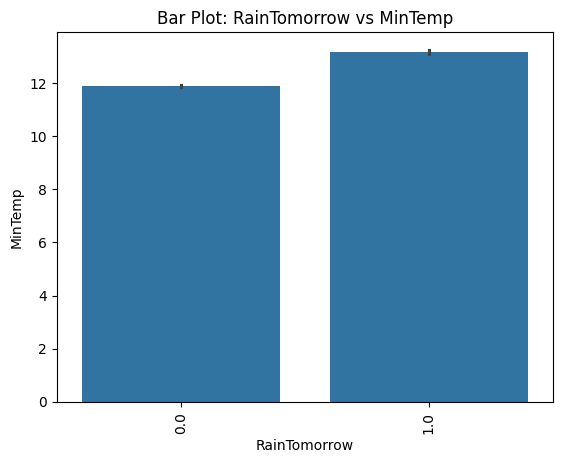

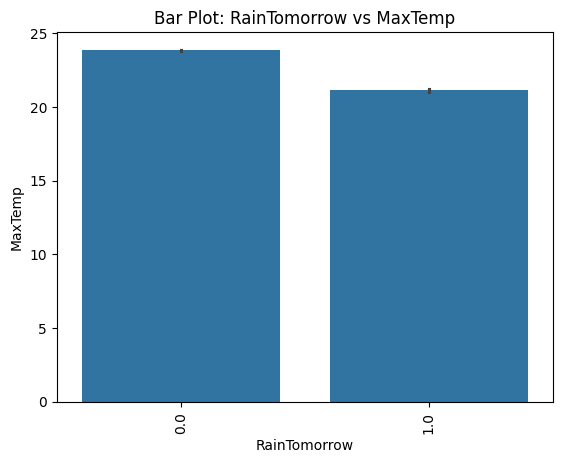

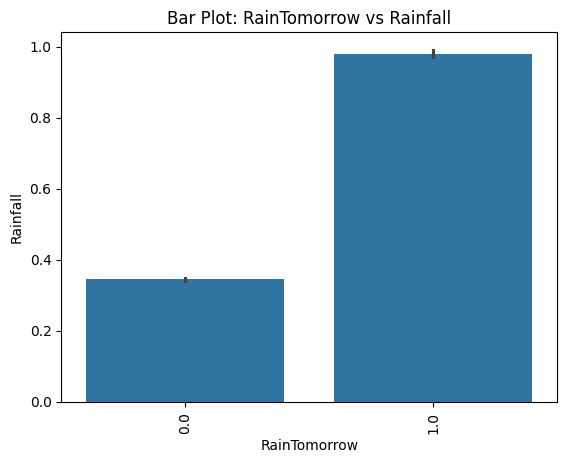

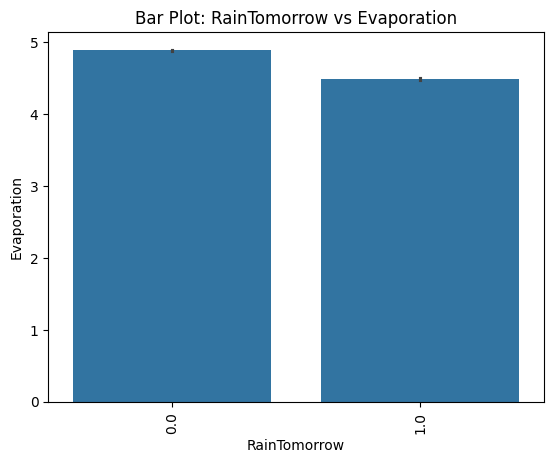

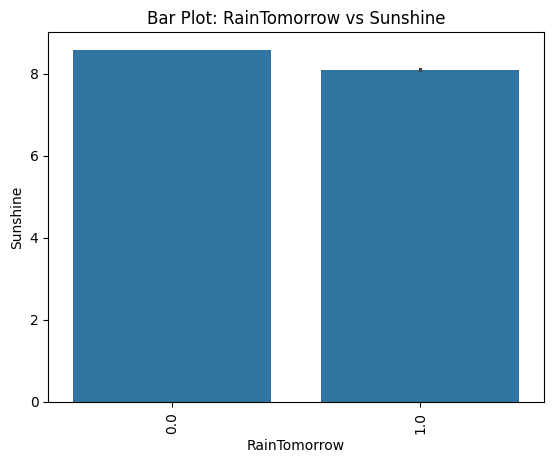

In [32]:
numericalcols=['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm', 'WindGustDirCos',
       'WindGustDirSin', 'WindDir9amCos', 'WindDir9amSin', 'WindDir3pmCos',
       'WindDir3pmSin']

categorical_cols=['Cloud9am', 'Cloud3pm','Location','RainToday','RainTomorrow']

# Correlation Matrix for Numerical Variables
plt.figure(figsize=(12, 8))
sns.heatmap(refined_data_without_outliers[numericalcols].corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix of Numerical Variables")
plt.show()


# # Scatter Plot: MaxTemp vs MinTemp (Strongly Correlated Variables)
# plt.figure(figsize=(8, 5))

b=0
for col1 in numericalcols:
       c=0
       b+=1
       if(b>5):
              break
       for (col2) in numericalcols:
              c+=1
              if(c>5):
                     break
              if(col1!=col2):
                     sns.scatterplot(x=refined_data_without_outliers[col1], y=refined_data_without_outliers[col2], alpha=0.5)
                     plt.xlabel(col1)
                     plt.ylabel(col2)
                     plt.title(f"Scatter Plot: {col1} vs {col2}")
                     plt.show()
b=0
for col1 in categorical_cols:
       c=0
       b+=1
       if(b>5):
              break
       for col2 in numericalcols:
              c+=1
              if(c>5):
                     break
              sns.barplot(x=col1, y=col2, data=refined_data_without_outliers)
              plt.xlabel(col1)
              plt.ylabel(col2)
              plt.xticks(rotation=90)
              plt.title(f"Bar Plot: {col1} vs {col2}")
              plt.show()





### box plot and violin plot

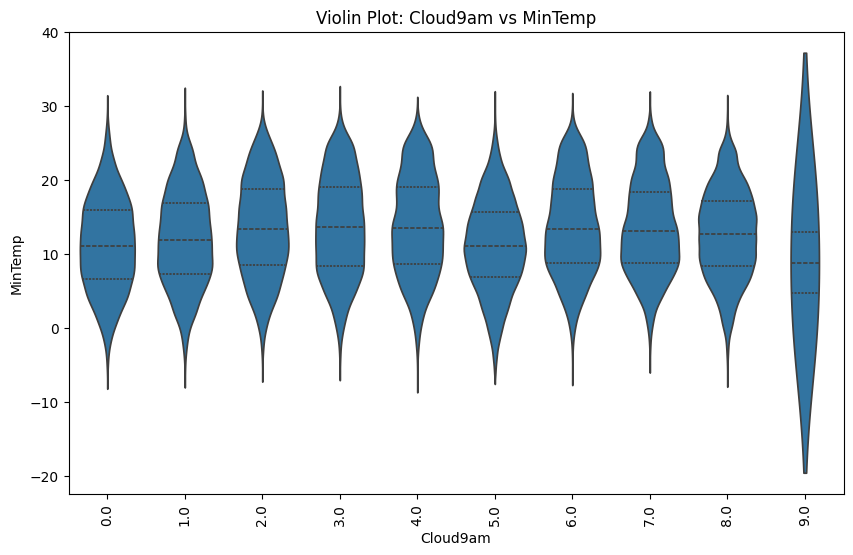

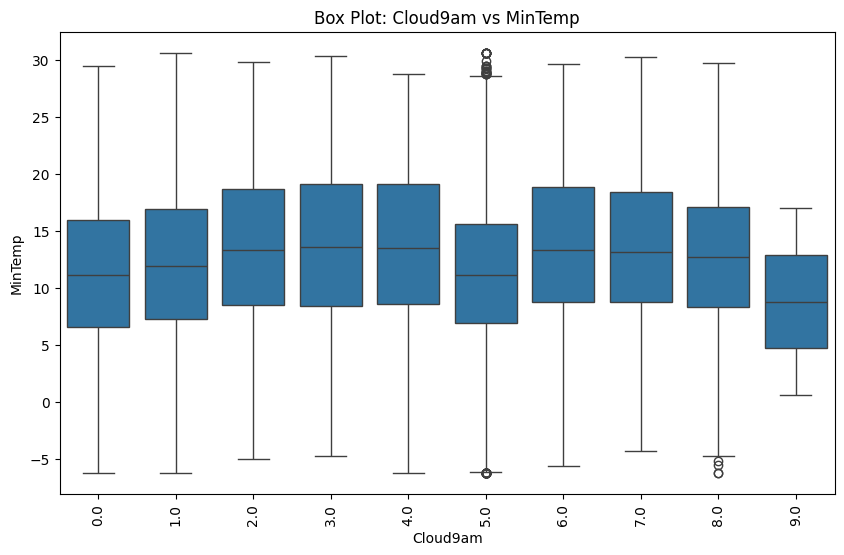

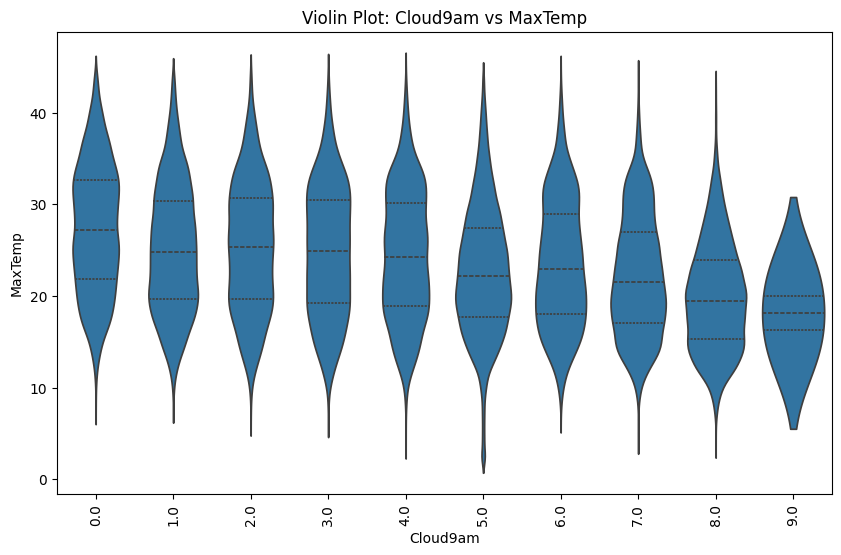

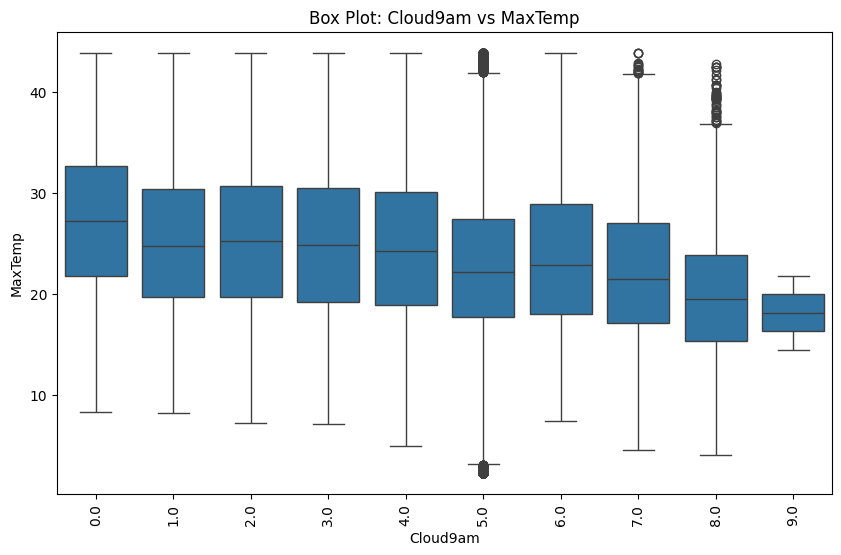

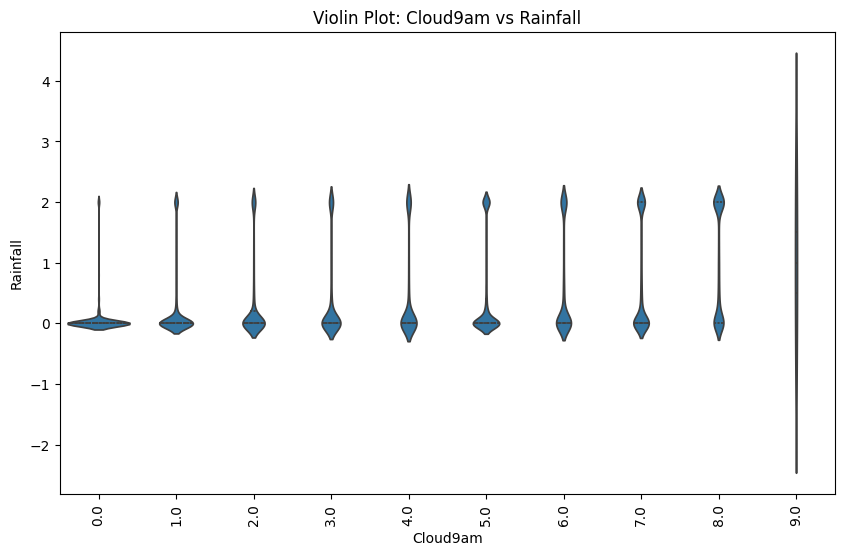

...

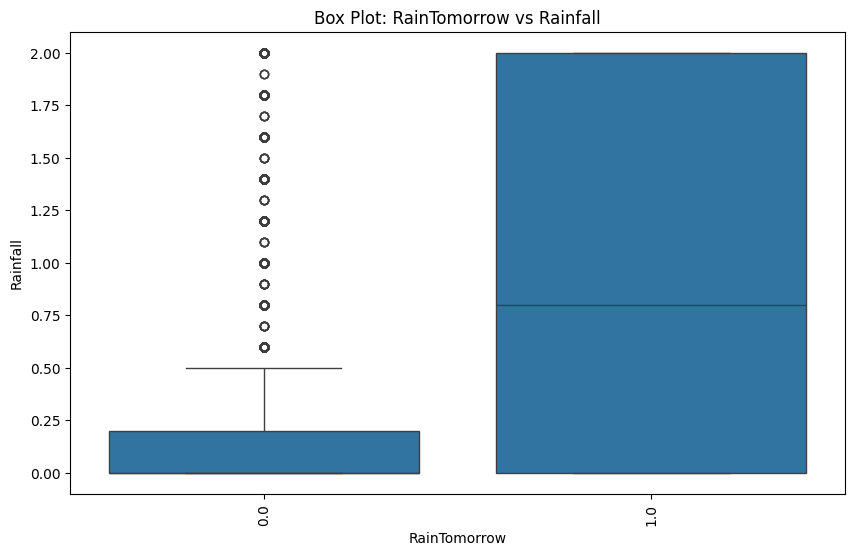

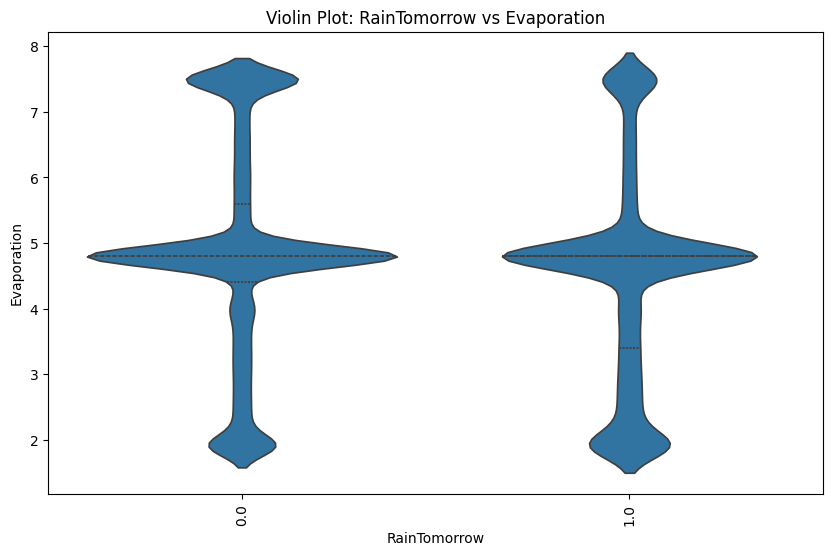

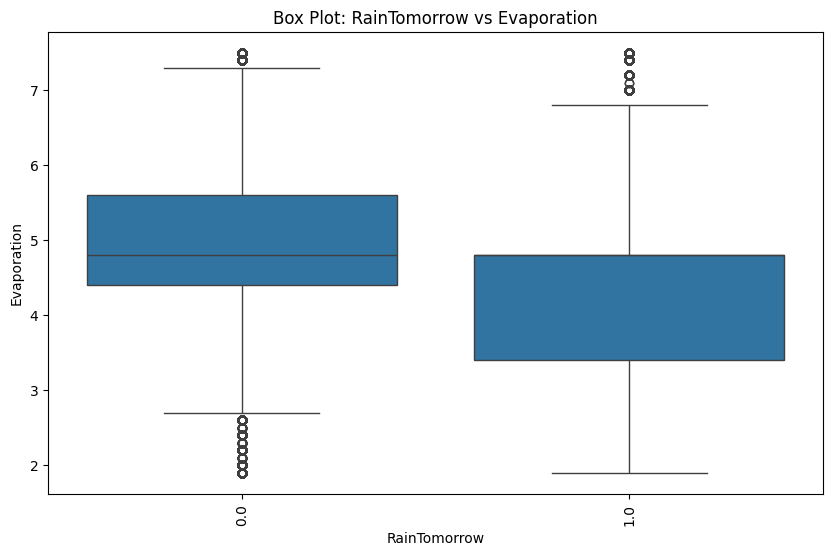

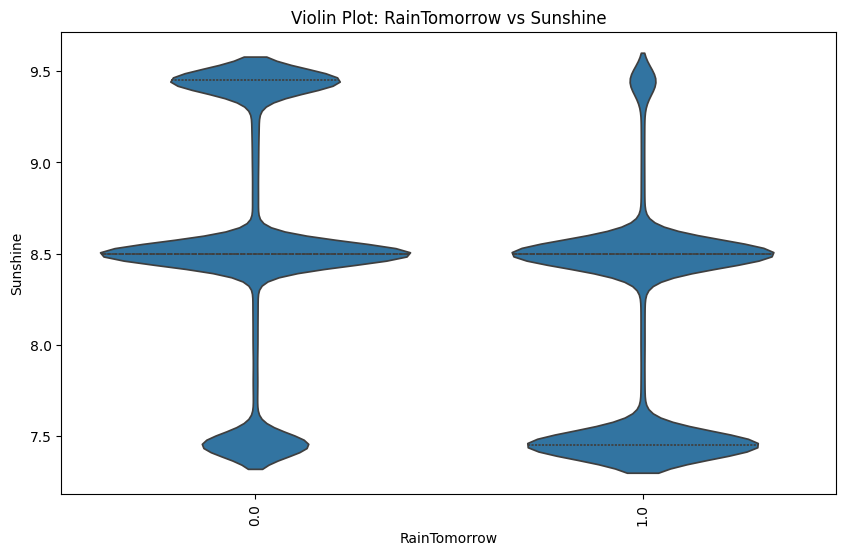

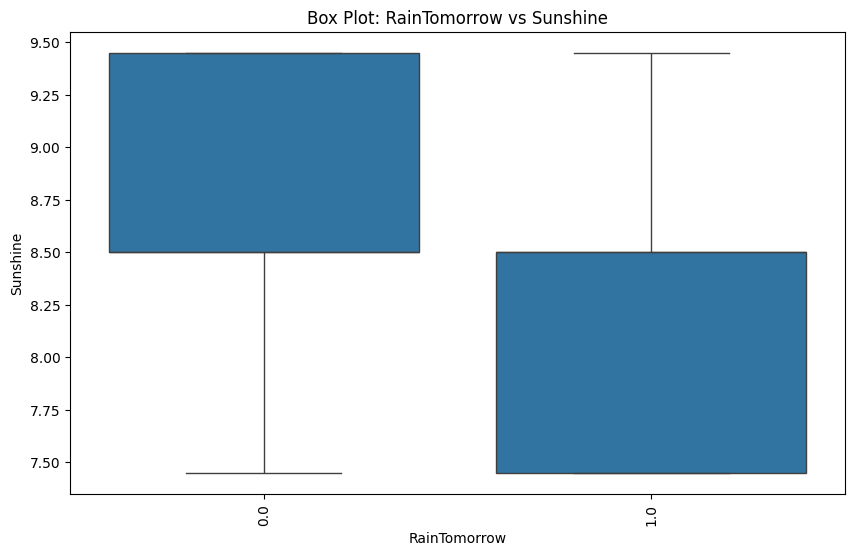

In [33]:
b = 0  # Counter for categorical columns

for col1 in categorical_cols:
    c = 0  # Counter for numerical columns
    b += 1
    if b > 5:  # Limit to first 5 categorical variables
       break

    for col2 in numericalcols:
       c += 1
       if c > 5:  # Limit to first 5 numerical variables
              break

       # Violin Plot
       plt.figure(figsize=(10, 6))
       sns.violinplot(x=col1, y=col2, data=refined_data_without_outliers, inner="quartile")
       plt.xlabel(col1)
       plt.ylabel(col2)
       plt.xticks(rotation=90)
       plt.title(f"Violin Plot: {col1} vs {col2}")
       plt.show()

       # Box Plot
       plt.figure(figsize=(10, 6))
       sns.boxplot(x=col1, y=col2, data=refined_data_without_outliers)
       plt.xlabel(col1)
       plt.ylabel(col2)
       plt.xticks(rotation=90)
       plt.title(f"Box Plot: {col1} vs {col2}")
       plt.show()


# Multivariate analysis

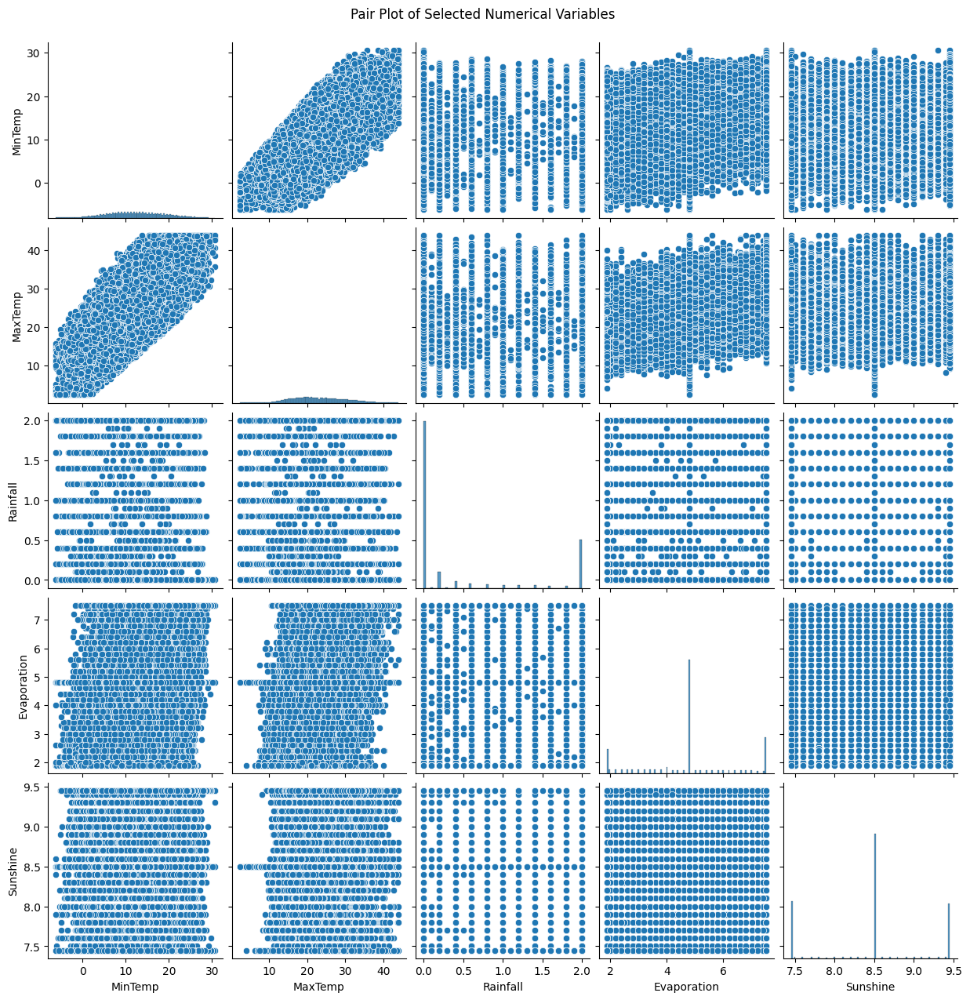

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pair plot for selected numerical columns
sns.pairplot(refined_data_without_outliers[numericalcols[:5]])  # Selecting first 5 numerical columns for clarity
plt.suptitle("Pair Plot of Selected Numerical Variables", y=1.02)
plt.show()


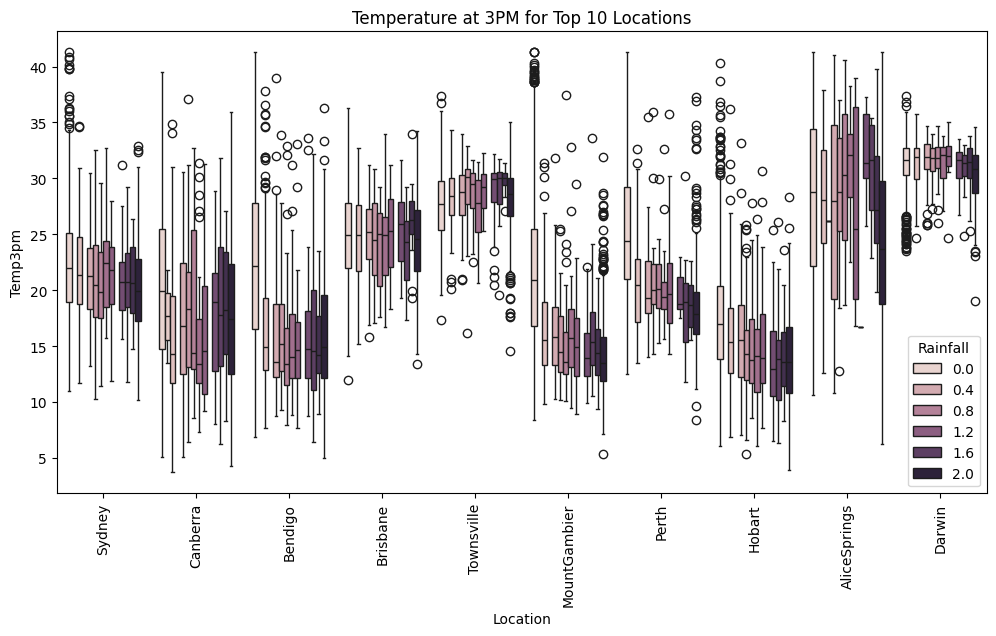

In [35]:
top_locations = refined_data_without_outliers["Location"].value_counts().index[:10]
filtered_data = refined_data_without_outliers[refined_data_without_outliers["Location"].isin(top_locations)]

plt.figure(figsize=(12, 6))
sns.boxplot(x="Location", y="Temp3pm", hue="Rainfall", data=filtered_data)
plt.xticks(rotation=90)
plt.title("Temperature at 3PM for Top 10 Locations")
plt.show()


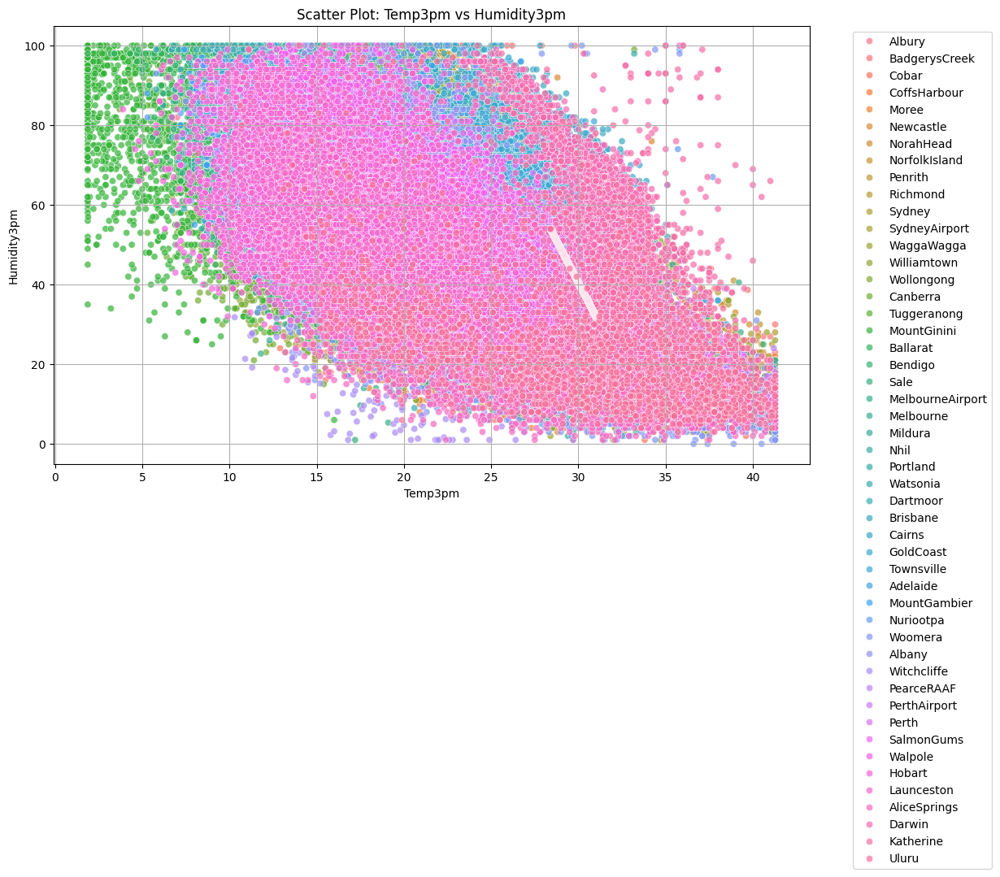

In [47]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define variables
x_col = "Temp3pm"         # X-axis (continuous)
y_col = "Humidity3pm"     # Y-axis (continuous)
hue_col = "Location"      # Hue (categorical)

# Set figure size
plt.figure(figsize=(12, 7))

# Create scatter plot
scatter_plot = sns.scatterplot(
    x=refined_data_without_outliers[x_col], 
    y=refined_data_without_outliers[y_col], 
    hue=refined_data_without_outliers[hue_col],
    sizes=(20, 200),  # Adjusts point size range
    alpha=0.7  # Transparency to reduce overlap
)

# Labels and title
plt.xlabel(x_col)
plt.ylabel(y_col)
plt.title(f"Scatter Plot: {x_col} vs {y_col}")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")  # Move legend outside
plt.grid(True)

# Show plot
plt.show()

